In [1]:
#importing necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
import time
import plotly.express as px
from joblib import Parallel, delayed

In [2]:
# Loading the dataset
df = pd.read_csv(r'C:\Users\LENOVO\Downloads\2000-2021 SINGLE TURKEY FIRE_M-C61_214067.csv')
df.head()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_27832\3780996666.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'C:\Users\LENOVO\Downloads\2000-2021 SINGLE TURKEY FIRE_M-C61_214067.csv')


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,36.8527,35.3594,306.0,2.1,1.4,2000-11-01,815,Terra,MODIS,60,6.03,294.4,13.2,D,0.0
1,40.5441,35.1786,307.8,1.1,1.0,2000-11-02,857,Terra,MODIS,66,6.03,296.0,5.8,D,0.0
2,40.1473,35.0444,305.3,1.1,1.0,2000-11-02,857,Terra,MODIS,46,6.03,293.5,4.3,D,0.0
3,40.5421,35.1909,310.0,1.1,1.0,2000-11-02,857,Terra,MODIS,69,6.03,296.1,7.3,D,0.0
4,41.2569,31.4172,307.9,1.1,1.0,2000-11-02,857,Terra,MODIS,0,6.03,290.4,8.0,D,2.0


In [3]:
df.shape

(211309, 15)

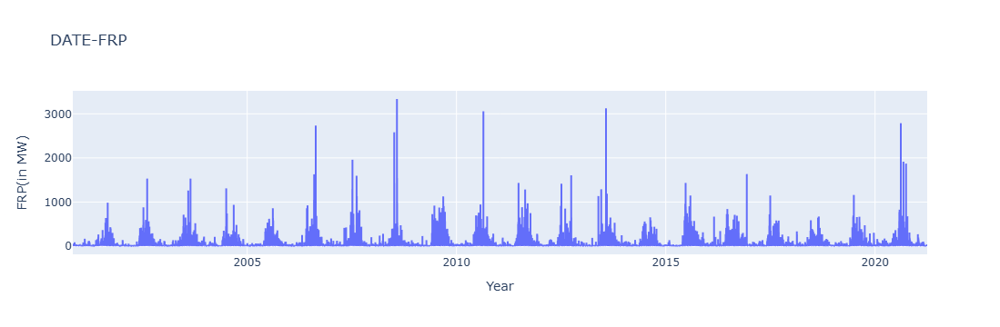

<Figure size 2000x700 with 0 Axes>

In [25]:
#Exploratory Data Analysis(EDA)
figure = plt.figure(figsize=(20,7))
fig_plot = px.line(x=df["acq_date"],y=df["frp"],title="DATE-FRP", labels={"x": "Year", "y": "FRP(in MW)"})
fig_plot.show()

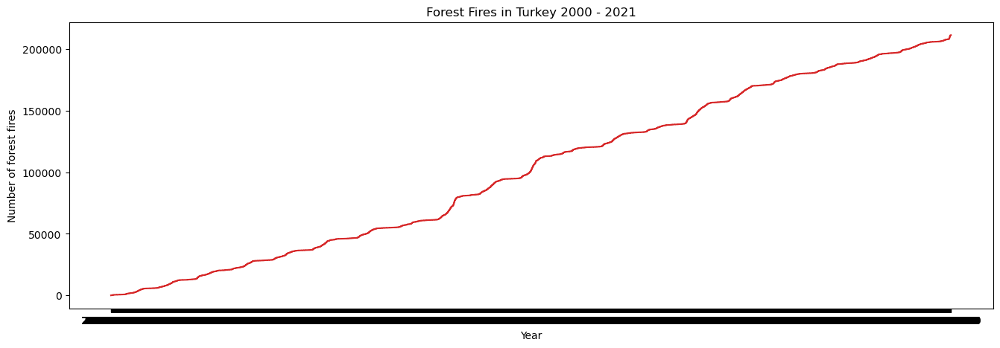

In [5]:
# Count of forest fires trends throught each year
def plottrend(df, x, y, title="", xlabel='Year', ylabel='Number of forest fires', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()
plottrend(df, x=df.acq_date, y=df.index, title='Forest Fires in Turkey 2000 - 2021') 

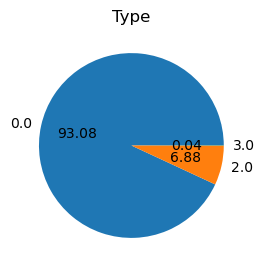

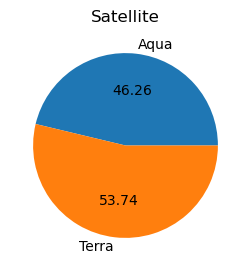

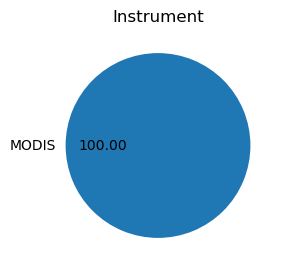

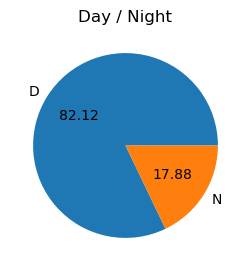

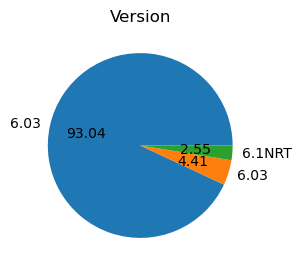

In [6]:
# plotting pie charts for categorical columns
plt.figure(0)
plt.title("Type")
df.groupby('type').size().plot(kind='pie', autopct='%.2f',figsize=(3, 3))
plt.figure(1)
plt.title("Satellite")
df.groupby('satellite').size().plot(kind='pie', autopct='%.2f',figsize=(3, 3))
plt.figure(2)
plt.title("Instrument")
df.groupby('instrument').size().plot(kind='pie', autopct='%.2f',figsize=(3, 3))
plt.figure(3)
plt.title("Day / Night")
df.groupby('daynight').size().plot(kind='pie', autopct='%.2f',figsize=(3, 3))
plt.figure(4)
plt.title("Version")
df.groupby('version').size().plot(kind='pie', autopct='%.2f',figsize=(3, 3))
plt.show()

In [7]:
#Data Cleaning and Preprocessing
df.info() # Checking for nulls
# Fill or drop missing 'type'
df = df.dropna(subset=['type'])
df['type'] = df['type'].astype(int)
# Encode categorical variables
df = pd.get_dummies(df, columns=['satellite', 'instrument', 'daynight'], drop_first=True)
df['acq_date'] = pd.to_datetime(df['acq_date'])
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211309 entries, 0 to 211308
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    211309 non-null  float64
 1   longitude   211309 non-null  float64
 2   brightness  211309 non-null  float64
 3   scan        211309 non-null  float64
 4   track       211309 non-null  float64
 5   acq_date    211309 non-null  object 
 6   acq_time    211309 non-null  int64  
 7   satellite   211309 non-null  object 
 8   instrument  211309 non-null  object 
 9   confidence  211309 non-null  int64  
 10  version     211309 non-null  object 
 11  bright_t31  211309 non-null  float64
 12  frp         211309 non-null  float64
 13  daynight    211309 non-null  object 
 14  type        205918 non-null  float64
dtypes: float64(8), int64(2), object(5)
memory usage: 24.2+ MB


,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,satellite_Terra,daynight_N
0,36.8527,35.3594,306.0,2.1,1.4,2000-11-01,815,60,6.03,294.4,13.2,0,True,False
1,40.5441,35.1786,307.8,1.1,1.0,2000-11-02,857,66,6.03,296.0,5.8,0,True,False
2,40.1473,35.0444,305.3,1.1,1.0,2000-11-02,857,46,6.03,293.5,4.3,0,True,False
3,40.5421,35.1909,310.0,1.1,1.0,2000-11-02,857,69,6.03,296.1,7.3,0,True,False
4,41.2569,31.4172,307.9,1.1,1.0,2000-11-02,857,0,6.03,290.4,8.0,2,True,False


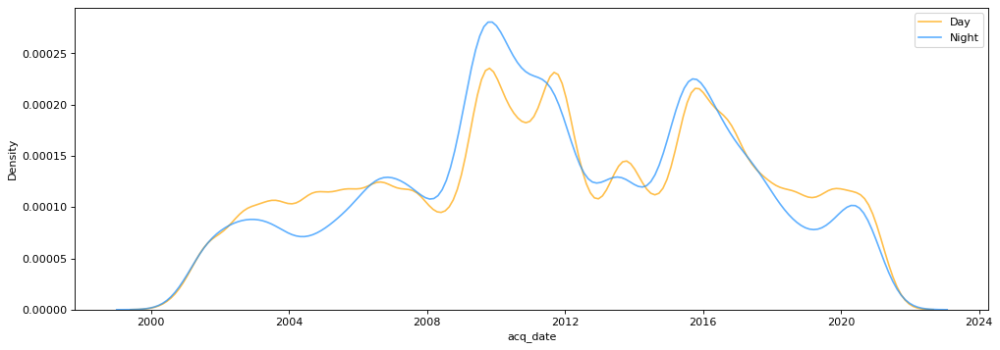

In [8]:
# density plot during the day and night
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(df.loc[df['daynight_N'] == 0, "acq_date"], color="orange", label="Day", alpha=.7)
sns.kdeplot(df.loc[df['daynight_N'] == 1, "acq_date"], color="dodgerblue", label="Night", alpha=.7)
plt.legend()
plt.show()

In [9]:
df.shape

(205918, 14)

In [10]:
#Feature and Target selection to predict 'type'
X_class = df.drop(['type', 'frp', 'acq_date'], axis=1)
y_class = df['type']

In [11]:
#Train-test split for RandomForestClassification model
X_train, X_test, y_train, y_test = train_test_split(X_class, y_class, test_size=0.2, random_state=42)

In [12]:
#Random Forest Classification model(non-parallel)
def run_random_forest_non_parallel():
    start = time.time()
    clf = RandomForestClassifier(n_estimators=100, n_jobs=1, random_state=42)  
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    return {
        'Model': "RF (Non-Parallel)",
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'recall': recall_score(y_test, y_pred, average='weighted'),
        'f1-score': f1_score(y_test, y_pred, average='weighted'),
        'Time (s)': time.time() - start,
        'Confusion Matrix': confusion_matrix(y_test, y_pred)
    }

In [13]:
#Random Forest Classification model(parallel)
def run_random_forest_parallel():
    start = time.time()
    clf = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    return {
        'Model': "RF (Parallel)",
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'recall': recall_score(y_test, y_pred, average='weighted'),
        'f1-score': f1_score(y_test, y_pred, average='weighted'),
        'Time (s)': time.time() - start,
        'Confusion Matrix': confusion_matrix(y_test, y_pred)
    }

In [14]:
#Logistic Regression model(non-parallel)
def run_logistic_non_parallel():
    start = time.time()
    lr_np = LogisticRegression(solver='lbfgs', max_iter=100)  
    lr_np.fit(X_train, y_train)
    y_pred = lr_np.predict(X_test)
    return {
        'Model': "LogReg (Non-Parallel)",
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'recall': recall_score(y_test, y_pred, average='weighted'),
        'f1-score': f1_score(y_test, y_pred, average='weighted'),
        'Time (s)': time.time() - start,
        'Confusion Matrix': confusion_matrix(y_test, y_pred)
    }

In [15]:
#Logistic Regression model(parallel)
def run_logistic_parallel():
    start = time.time()
    lr_p = LogisticRegression(solver='saga', max_iter=100, n_jobs=-1)
    lr_p.fit(X_train, y_train)
    y_pred = lr_p.predict(X_test)
    return {
        'Model': "LogReg (Parallel)",
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'recall': recall_score(y_test, y_pred, average='weighted'),
        'f1-score': f1_score(y_test, y_pred, average='weighted'),
        'Time (s)': time.time() - start,
        'Confusion Matrix': confusion_matrix(y_test, y_pred)
    }

In [16]:
results = Parallel(n_jobs=4)(
    delayed(f)() for f in [
        run_random_forest_non_parallel,
        run_random_forest_parallel,
        run_logistic_non_parallel,
        run_logistic_parallel
    ]
)

In [17]:
results_df = pd.DataFrame(results)

In [18]:
print(results_df[['Model', 'Accuracy', 'Precision', 'recall', 'f1-score', 'Time (s)']].to_string(index=False))

                Model  Accuracy  Precision   recall  f1-score  Time (s)
    RF (Non-Parallel)  0.971470   0.970470 0.971470  0.968919 58.873295
        RF (Parallel)  0.971470   0.970470 0.971470  0.968919  7.127043
LogReg (Non-Parallel)  0.931163   0.901359 0.931163  0.900673  7.261044
    LogReg (Parallel)  0.931065   0.901135 0.931065  0.901402 20.088338


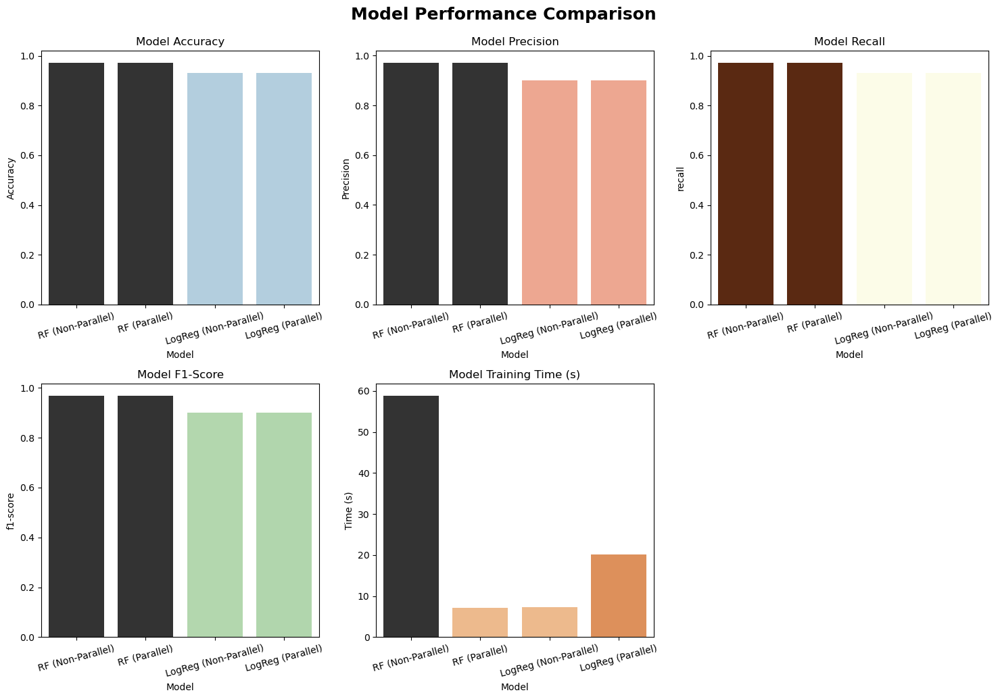

In [19]:
#Model Performance Comparison
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.3)

#Model Accuracy Comaparison
sns.barplot(data=results_df, x='Model', y='Accuracy', palette='Blues_d', hue='Accuracy', legend= False, ax=axs[0, 0])
axs[0, 0].set_title("Model Accuracy")
axs[0, 0].tick_params(axis='x', rotation= 15)

#Model Precision Comparison
sns.barplot(data=results_df, x='Model', y='Precision', palette='Reds_d',hue='Precision', legend= False, ax=axs[0, 1])
axs[0, 1].set_title("Model Precision")
axs[0, 1].tick_params(axis='x', rotation= 15)

#Model Recall Comaprsion
sns.barplot(data=results_df, x='Model', y='recall', palette='YlOrBr',hue='recall', legend= False, ax=axs[0, 2])
axs[0, 2].set_title("Model Recall")
axs[0, 2].tick_params(axis='x', rotation= 15)

#Model F1-Score Comparison
sns.barplot(data=results_df, x='Model', y='f1-score', palette='Greens_d',hue='f1-score', legend= False, ax=axs[1, 0])
axs[1, 0].set_title("Model F1-Score")
axs[1, 0].tick_params(axis='x', rotation= 15)

#Model Training Time Comparison
sns.barplot(data=results_df, x='Model', y='Time (s)', palette='Oranges_d',hue='Time (s)', legend= False, ax=axs[1, 1])
axs[1, 1].set_title("Model Training Time (s)")
axs[1, 1].tick_params(axis='x', rotation= 15)
axs[1, 2].axis('off') # Hiding unused subplot
plt.tight_layout()
plt.suptitle("Model Performance Comparison", fontsize=18, fontweight='bold', y=1.03)
plt.show()


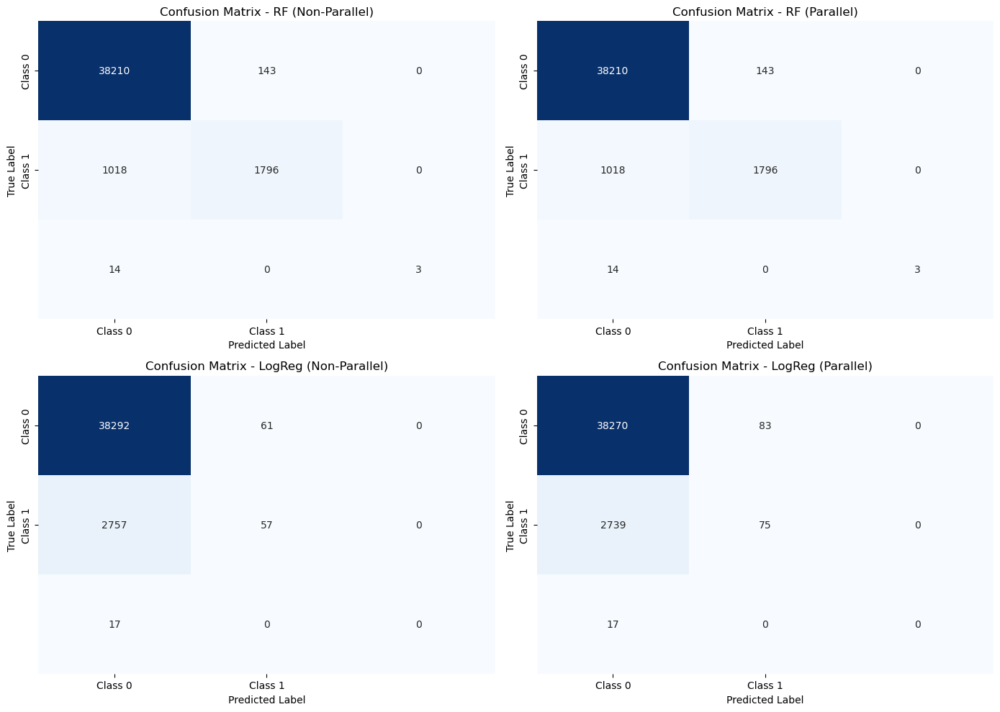

In [20]:
#Confusion Matrix Visualization
plt.figure(figsize=(14, 10))
for i, res in enumerate(results):
    cm = res['Confusion Matrix']
    model_name = res['Model']
    plt.subplot(2, 2, i+1)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar= False,
                xticklabels=['Class 0', 'Class 1'],
                yticklabels=['Class 0', 'Class 1'])
    plt.title(f'Confusion Matrix - {model_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()